# scplotter to work with Nanostring CosMx data prepared by Giotto

See: <https://drieslab.github.io/Giotto_website/articles/nanostring_cosmx_lung_cancer.html>

Go back to scplotter documentation: <https://pwwang.github.io/scplotter/>

In [1]:
library(Giotto)

# Ensure Giotto can access a python env
genv_exists <- suppressMessages(checkGiottoEnvironment())
print(genv_exists)

python_path <- file.path(Sys.getenv("HOME"), "miniconda3", "envs", "giotto_env", "bin", "python")
Sys.setenv(RETICULATE_PYTHON = python_path)

invisible(capture.output(suppressMessages(set_giotto_python_path(python_path = python_path))))

# library(scplotter)
devtools::load_all()

Loading required package: GiottoClass



Newer devel version of GiottoClass on GitHub: 0.4.8

Giotto Suite 4.2.1



[1] TRUE


ℹ Loading scplotter


In [2]:
library(Giotto)

## Set instructions
results_folder <- "data/Nanostring_CosMx_Subcellular_Lung_Cancer.results"

instrs <- createGiottoInstructions(
    save_dir = results_folder,
    save_plot = FALSE,
    show_plot = TRUE,
    return_plot = TRUE,
    python_path = python_path
)

data_path <- "data/Nanostring_CosMx_Subcellular_Lung_Cancer/Lung12/Lung12-Flat_files_and_images/"

## create giotto cosmx object
cosmx <- suppressWarnings(createGiottoCosMxObject(
    cosmx_dir = data_path,
    version = "legacy", # set to this for legacy NSCLC dataset
    FOVs = seq_len(28), # defaults to all FOVs
    load_expression = FALSE, # defaults to FALSE (see feature aggregation step below)
    instructions = instrs
))

force(cosmx)

python already initialized in this session
 active environment : 'giotto_env'
 python version : 3.10

python already initialized in this session
 active environment : 'giotto_env'
 python version : 3.10

loading feature detections...

Setting feature info [rna]

Setting feature info [negprobes]

loading composite images...

loading overlay images...

loading cell metadata...



An object of class giotto 
>Active spat_unit:  cell 
>Active feat_type:  rna 
dimensions    : 960, 73997 (features, cells)
[SUBCELLULAR INFO]
polygons      : cell 
features      : rna negprobes 
[AGGREGATE INFO]
spatial locations ----------------
  [cell] raw
attached images ------------------
images      : 56 items...


Use objHistory() to see steps and params used

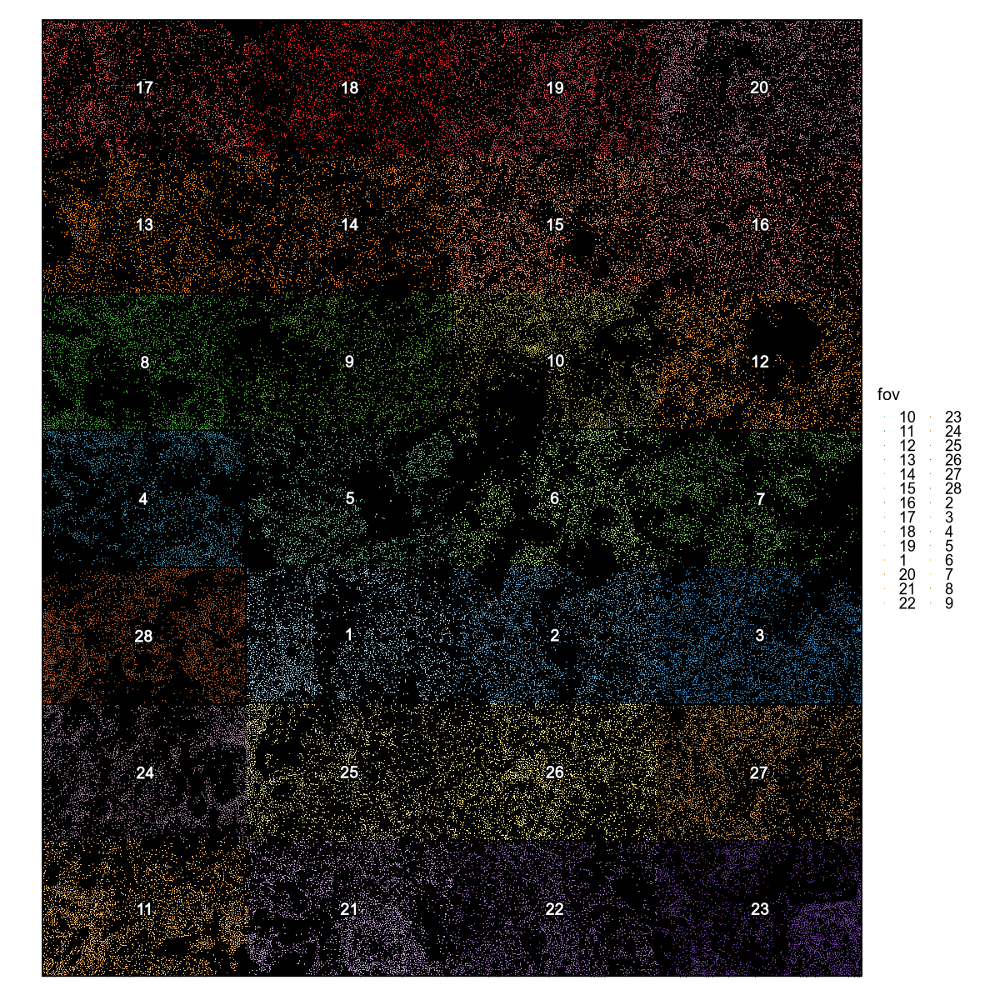

In [3]:
options(repr.plot.width = 10, repr.plot.height = 10)

SpatDimPlot(
    cosmx,
    label = TRUE,
    label_pos = "center",
    group_by = "fov",
    points_size = 0.1,
    image = "black"
)

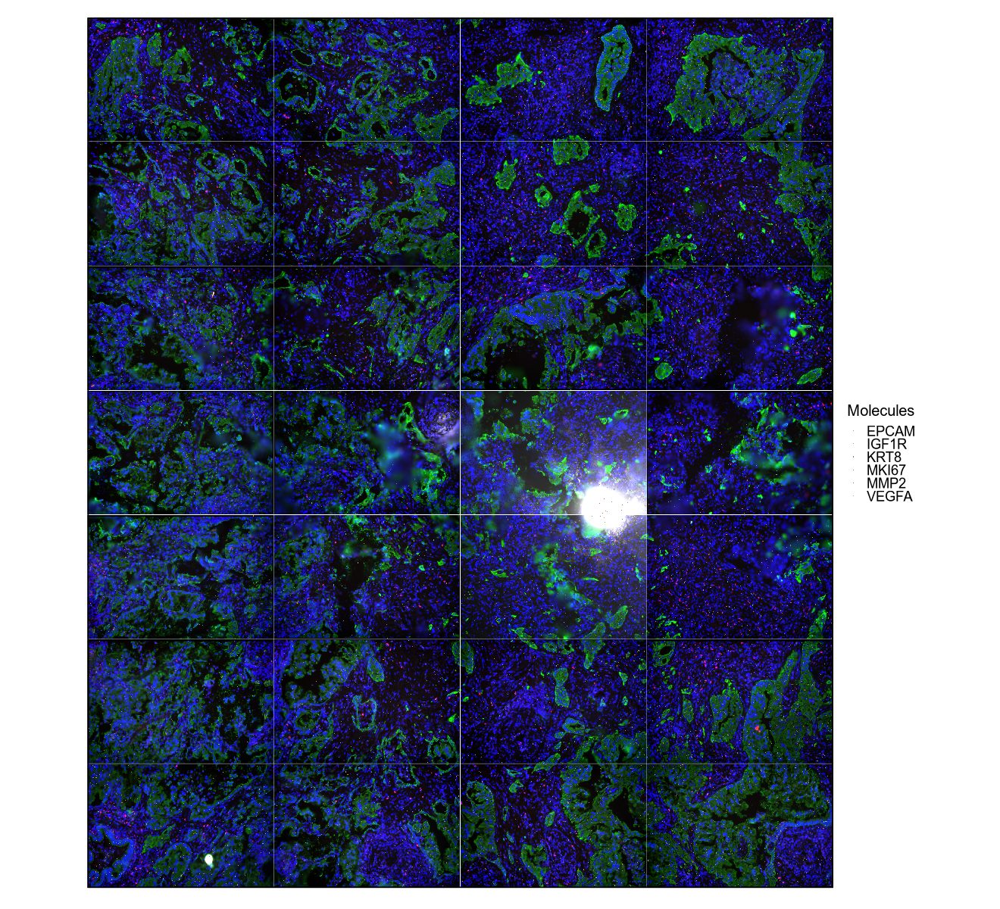

In [4]:
options(repr.plot.width = 11, repr.plot.height = 10)
# devtools::load_all()

SpatDimPlot(
    cosmx,
    image = TRUE,  # use all fovs
    features = c(
        "MMP2", "VEGFA", "IGF1R",
        "MKI67", "EPCAM", "KRT8"
    ),
    spat_unit = "cell",
    points_size = 0.01,
    points_palette = "Vivid"
)

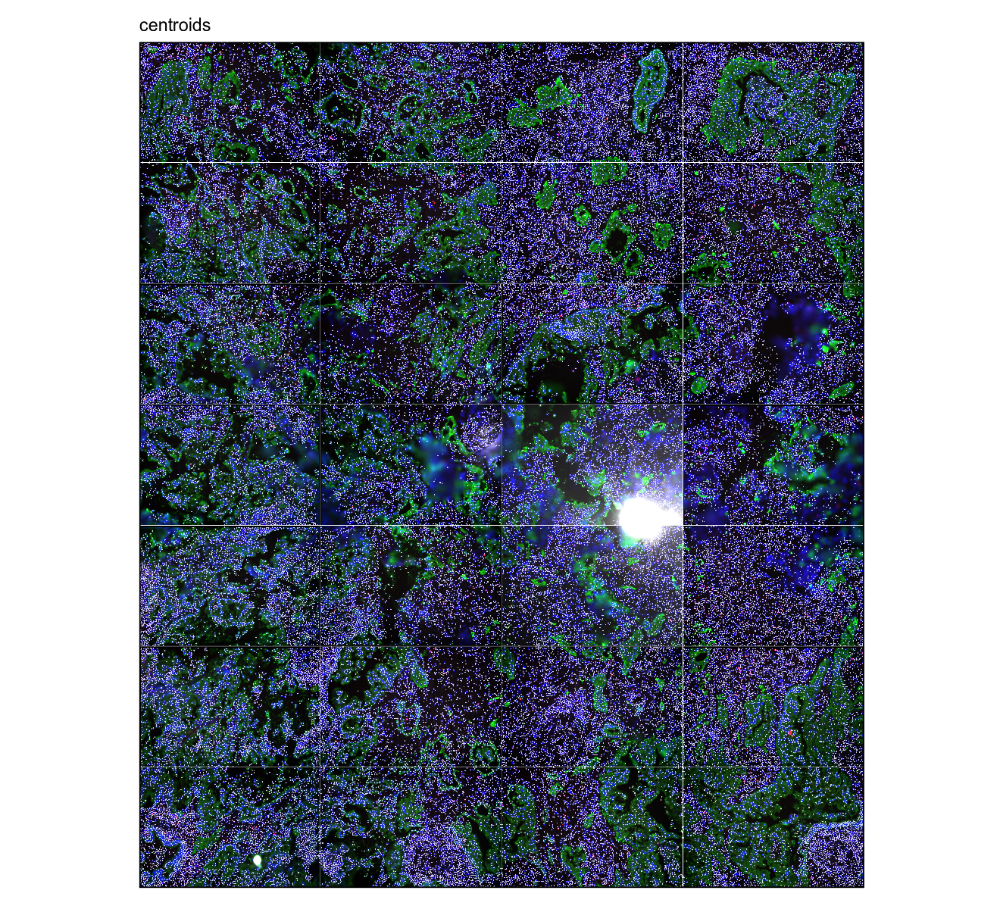

In [5]:
options(repr.plot.width = 11, repr.plot.height = 10)
# Visualize Cell Centroids

SpatDimPlot(
    cosmx,
    image = TRUE,  # use all fovs
    size = 0.1,
    alpha = 0.8,
    color_by = "white",
    title = "centroids"
)

In [6]:
# Aggregate subcellular features
# Find the feature points overlapped by polygons. This overlap information is then
# returned to the relevant giottoPolygon object"s overlaps slot.
cosmx <- calculateOverlapRaster(cosmx, feat_info = "rna")
cosmx <- calculateOverlapRaster(cosmx, feat_info = "negprobes")

# Convert the overlap information into a cell by feature expression matrix which
# is then stored in the Giotto object"s expression slot
cosmx <- overlapToMatrix(cosmx, feat_info = "rna")
cosmx <- overlapToMatrix(cosmx, feat_info = "negprobes")

cosmx <- filterGiotto(cosmx,
    feat_type = "rna",
    expression_threshold = 1,
    feat_det_in_min_cells = 5,
    min_det_feats_per_cell = 5
)

# normalize
# standard method of normalization (log normalization based)
cosmx <- normalizeGiotto(cosmx,
    feat_type = "rna",
    norm_methods = "standard"
)

# new normalization method based on pearson correlations (Lause/Kobak et al. 2021)
# this normalized matrix is given the name "pearson" using the update_slot param
cosmx <- normalizeGiotto(cosmx,
    feat_type = "rna",
    scalefactor = 5000,
    norm_methods = "pearson_resid",
    name = "pearson"
)
# add statistics based on log normalized values
cosmx <- addStatistics(cosmx,
    expression_values = "normalized",
    feat_type = "rna"
)

# add statistics for the raw negative probe values
cosmx <- addStatistics(cosmx,
    expression_values = "raw",
    feat_type = "negprobes"
)

# View cellular data (default is feat = "rna")
showGiottoCellMetadata(cosmx)

# View feature data
showGiottoFeatMetadata(cosmx)

1. convert polygon to raster



2. overlap raster and points

3. add polygon information

4. add points information

5. create overlap polygon
 information

1. convert polygon to raster

2. overlap raster and points

3. add polygon information

4. add points information

5. create overlap polygon
 information

completed 1: preparation

completed 2: subset expression data

completed 3: subset spatial locations

completed 4: subset cell metadata

completed 5: subset feature metadata

completed 6: subset spatial network(s)

completed 7: subsetted dimension reductions

completed 8: subsetted nearest network(s)

completed 9: subsetted spatial enrichment results

for cell

--> cell found back in polygon layer: cell

completed 10: subsetted spatial information data

subset feature info: rna

completed 11: subsetted spatial feature data




Feature type:  rna 
Number of cells removed:  775  out of  73997 
Number of feats removed:  0  out of  960 


first scale feats and then cells

Setting expression [cell][rna] normalized

Setting expression [cell][rna] scaled

using 'Lause/Kobak' method to normalize count matrix If used in
        published research, please cite:
        Jan Lause, Philipp Berens, Dmitry Kobak (2020).
        'Analytic Pearson residuals for normalization of single-cell RNA-seq UMI
        data' 

Setting expression [cell][rna] pearson

calculating statistics for "normalized" expression

calculating statistics for "raw" expression


These column names were already used: area
 and will be overwritten



└──Spatial unit "cell"
   ├──Feature type "rna"
   │     An object of class cellMetaObj 
   │     spat_unit : "cell"
   │     feat_type : "rna"
   │     provenance: cell 
   │     dimensions: 4 20 
   │     
   │        cell_ID  Area AspectRatio Width Height Mean.MembraneStain Max.MembraneStain
   │         <char> <int>       <num> <int>  <int>              <int>             <int>
   │     1: c_1_1_1  3411        1.98    93     47               7127             16033
   │     2: c_1_1_2  2993        1.77    78     44              13547             25859
   │     3: c_1_1_3  5590        1.75   112     64              10353             22954
   │        Mean.PanCK Max.PanCK Mean.CD45 Max.CD45 Mean.CD3 Max.CD3 Mean.DAPI Max.DAPI
   │             <int>     <int>     <int>    <int>    <int>   <int>     <int>    <int>
   │     1:       3000     17172        78      588       80     610     12242    47623
   │     2:      12494     23204       102      410        0      85         0        0


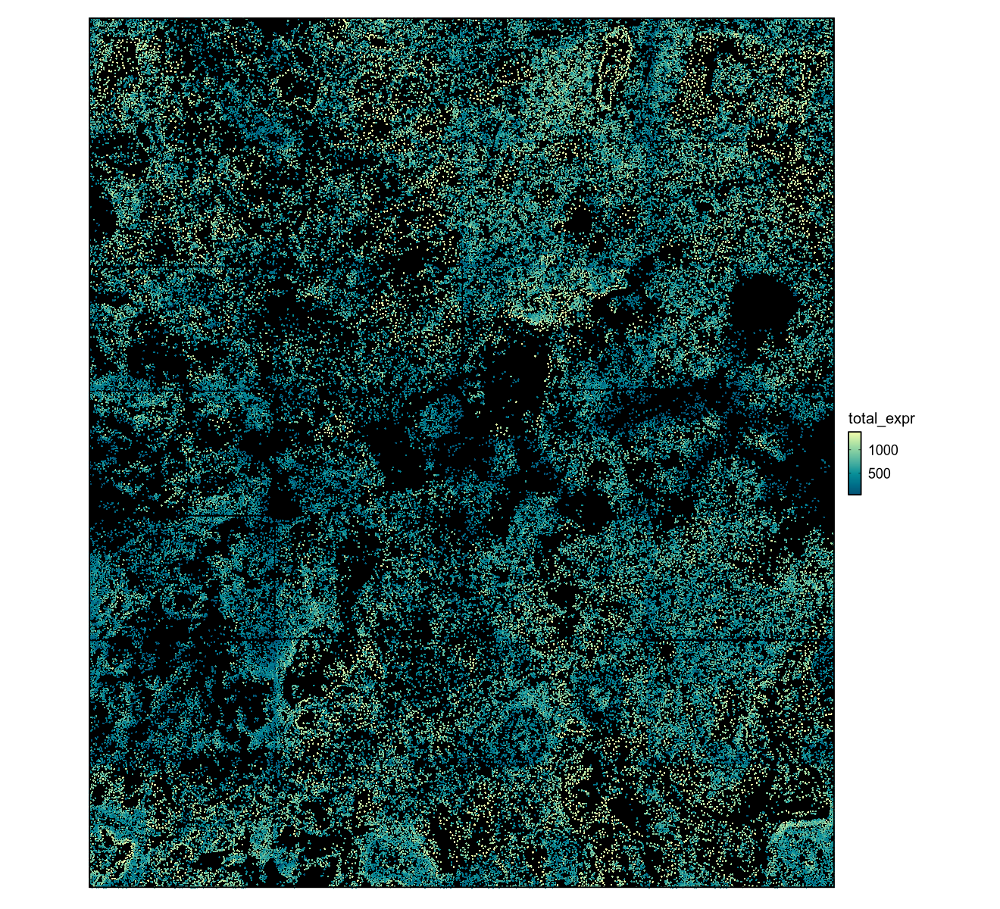

In [7]:
options(repr.plot.width = 11, repr.plot.height = 10)

SpatFeaturePlot(
    cosmx,
    image = "black",
    feature = "total_expr",
    points_size = 0.4,
    points_palette = "BluYl",
    points_palette_reverse = TRUE
)

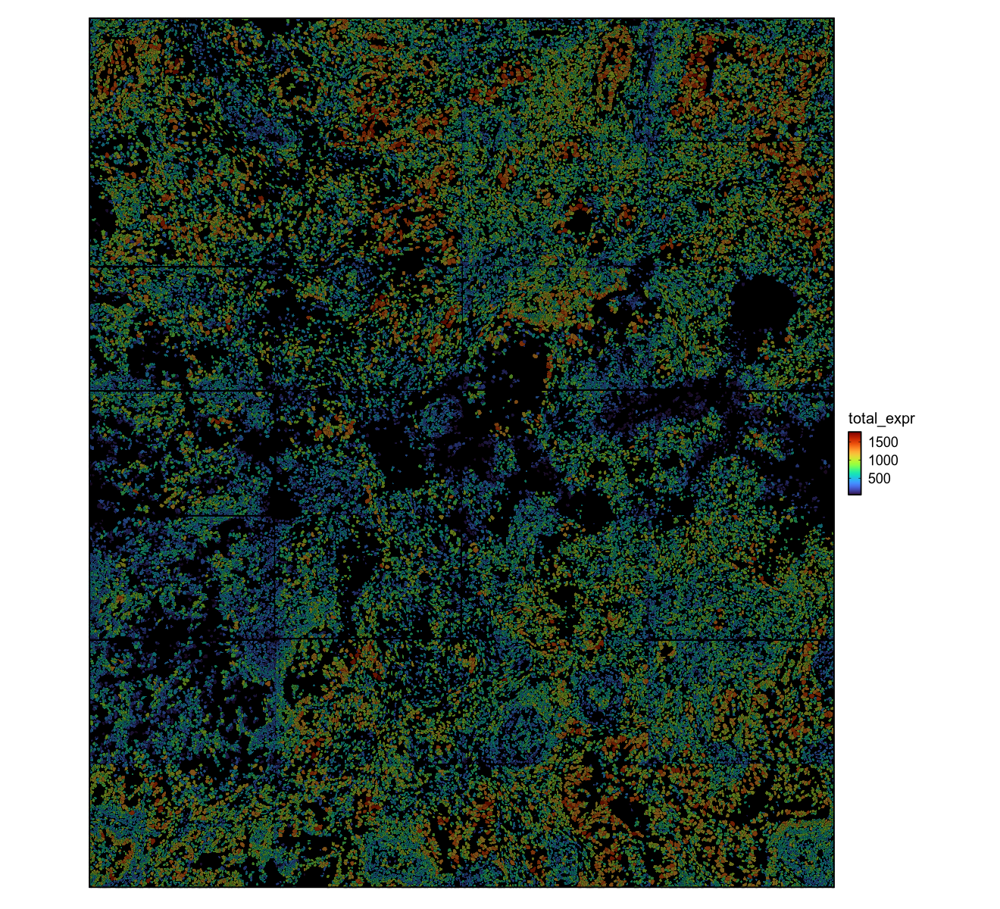

In [8]:
options(repr.plot.width = 11, repr.plot.height = 10)

SpatFeaturePlot(
    cosmx,
    image = "black",
    points = FALSE,
    shapes_fill_by = "total_expr",  # indicating shapes = TRUE
    shapes_border_size = 0.05
)

In [9]:
cosmx <- calculateHVF(cosmx,
    method = "var_p_resid",
    var_number = 500, # leaving as NULL results in too few genes to use
    save_plot = TRUE,
    save_param = list(
        save_name = "10_hvf"
    )
)
# If you get an Error related to future.apply, please modify the maximum size
# of global variables by running: options(future.globals.maxSize = 1e10)

# print HVFs
gene_metadata <- fDataDT(cosmx)
gene_metadata[hvf == "yes", feat_ID]

cosmx <- runPCA(cosmx,
    scale_unit = FALSE,
    center = FALSE,
    expression_values = "pearson"
)

cosmx <- runtSNE(cosmx,
    dimensions_to_use = 1:10
)

cosmx <- runUMAP(cosmx,
    dimensions_to_use = 1:10
)

cosmx <- createNearestNetwork(cosmx,
    dimensions_to_use = 1:10,
    k = 10
)

cosmx <- doLeidenCluster(cosmx,
    resolution = 0.07,
    n_iterations = 100
)


[1] "SEC61G"    "IGHA1"     "IL6"       "KRT86"     "NEAT1"     "S100A10"  
  [7] "FYN"       "NDRG1"     "AGR2"      "FGR"       "IL4R"      "COL16A1"  
 [13] "STAT3"     "MAPK14"    "VHL"       "CD44"      "RAMP1"     "ZFP36"    
 [19] "CD27"      "GDF15"     "EPCAM"     "LTB"       "COL12A1"   "LGALS9"   
 [25] "HLA-DQB1"  "CLU"       "ALCAM"     "FGF1"      "NR1H3"     "EIF5A"    
 [31] "LGALS3"    "CD63"      "DCN"       "LIF"       "HCST"      "VSIR"     
 [37] "STAT1"     "UBE2C"     "PDGFC"     "YES1"      "TGFBR2"    "IFIH1"    
 [43] "SOX9"      "MX1"       "IGKC"      "CD8A"      "PTGES3"    "KRAS"     
 [49] "CRYAB"     "ACTA2"     "BCL2L1"    "SRGN"      "CD53"      "MTRNR2L1" 
 [55] "LAIR1"     "EFNA1"     "FES"       "MZT2A"     "SERPINA1"  "JUN"      
 [61] "THBS1"     "CD274"     "CXCL3"     "IL11"      "GPX1"      "EPHA2"    
 [67] "TGFB3"     "CLDN4"     "KITLG"     "RPL34"     "HLA-A"     "HDAC1"    
 [73] "MGP"       "MRC2"      "COL4A2"    "CDH1"      "ATG10"     "IL32"     
 [79] "SERPINA3"  "SRC"       "IGFBP6"    "IER3"      "QRFPR"     "CD276"    
 [85] "ITGA9"     "INHBA"     "CXCL1"     "ATG12"     "ERBB2"     "FCRLA"    
 [91] "EFNB1"     "IGHG2"     "SAA1"      "JUNB"      "COTL1"     "CSF1R"    
 [97] "TNFAIP6"   "KIT"       "CXCR4"     "CD28"      "RGS1"      "IGFBP3"   
[103] "NOD2"      "KRT1"      "CCL3"      "CD48"      "TYK2"      "TGFB1"    
[109] "CD2"       "CTSG"      "CFLAR"     "IDO1"      "TIMP1"     "TGFBR1"   
[115] "BTK"       "HSPB1"     "WNT5A"     "TAP1"      "CRIP1"     "ITGA3"    
[121] "CD3E"      "TGFB2"     "HLA-DRA"   "ITGAE"     "CSF3"      "COL6A1"   
[127] "IL1RN"     "CCR7"      "CD19"      "VCAN"      "FAS"       "EPHB4"    
[133] "TYROBP"    "KRT14"     "TACSTD2"   "JCHAIN"    "WIF1"      "ANXA2"    
[139] "CYSTM1"    "RPL32"     "CFD"       "THBS2"     "IL10RB"    "CXCL2"    
[145] "GZMH"      "PECAM1"    "CCL2"      "DUSP5"     "SLC40A1"   "PTGDR2"   
[151] "ITGB8"     "SAT1"      "S100A6"    "IGFBP7"    "S100P"     "IFI27"    
[157] "H4C3"      "CX3CL1"    "CALM3"     "DUSP6"     "COL6A2"    "SOX4"     
[163] "KRT19"     "TPM2"      "COL1A2"    "RAC1"      "RPL21"     "IL15RA"   
[169] "HMGN2"     "VEGFA"     "CDKN1A"    "COL18A1"   "IGF1"      "SLPI"     
[175] "FLT1"      "CD9"       "TNFRSF12A" "MIF"       "YBX3"      "S100A4"   
[181] "INHA"      "IGHG1"     "CLEC12A"   "NPPC"      "KRT8"      "TPSAB1"   
[187] "TUBB"      "KRT7"      "CTNNB1"    "SPARCL1"   "POU5F1"    "IRF3"     
[193] "MMP7"      "TNFRSF11B" "DDR1"      "IL1RAP"    "TWIST1"    "LDLR"     
[199] "CAV1"      "IL1A"      "B2M"       "ELANE"     "ITGAV"     "FKBP11"   
[205] "ICAM3"     "TNFSF10"   "CD80"      "PHLDA2"    "IL13RA1"   "HILPDA"   
[211] "KLF2"      "IL18"      "COL1A1"    "GLUL"      "TM4SF1"    "KRT6C"    
[217] "COL5A2"    "CSHL1"     "TPSB2"     "C1QC"      "CXCL16"    "IGF2"     
[223] "RARRES2"   "AZU1"      "CLEC4A"    "GSTP1"     "GPBAR1"    "TNFRSF1A" 
[229] "IFITM3"    "DUSP1"     "ITGA6"     "CD14"      "SERPINH1"  "CRP"      
[235] "MMP2"      "IGF2R"     "TAGLN"     "PSAP"      "KLRK1"     "BGN"      
[241] "TNFRSF9"   "PTK2"      "IL23A"     "RXRB"      "NOTCH3"    "FOXF1"    
[247] "COL15A1"   "SQSTM1"    "CCL15"     "S100A2"    "RGCC"      "IL2RA"    
[253] "COL3A1"    "ITGB6"     "CD74"      "ANXA4"     "SFN"       "HLA-B"    
[259] "HLA-DRB5"  "CD3D"      "ITGA1"     "MALAT1"    "HSP90AB1"  "S100A9"   
[265] "FZD8"      "HDAC3"     "ITGB2"     "CALD1"     "COL11A1"   "C9orf16"  
[271] "IL1B"      "BID"       "MT1X"      "KLK3"      "ITGA2"     "CCL5"     
[277] "IGFBP5"    "CCND1"     "TLR2"      "COL27A1"   "FFAR4"     "FGF7"     
[283] "MMP14"     "NOSIP"     "FABP5"     "IFNGR1"    "VTN"       "ITGB1"    
[289] "SOX2"      "GNLY"      "CCRL2"     "IGF1R"     "LMNA"      "LCN2"     
[295] "PSCA"      "IFNAR2"    "TNFRSF14"  "SNAI2"     "OLFM4"     "CYTOR"    
[301] "RARA"      "RUNX3"     "PIGR"      "RGS2"      "CDKN3"     "FZD4"     
[307] "SMO"       "CD81"

"hvf" column was found in the feats metadata information and will be
 used to select highly variable features



Setting dimension reduction [cell][rna] pca

Setting dimension reduction [cell][rna] tsne

Setting dimension reduction [cell][rna] umap



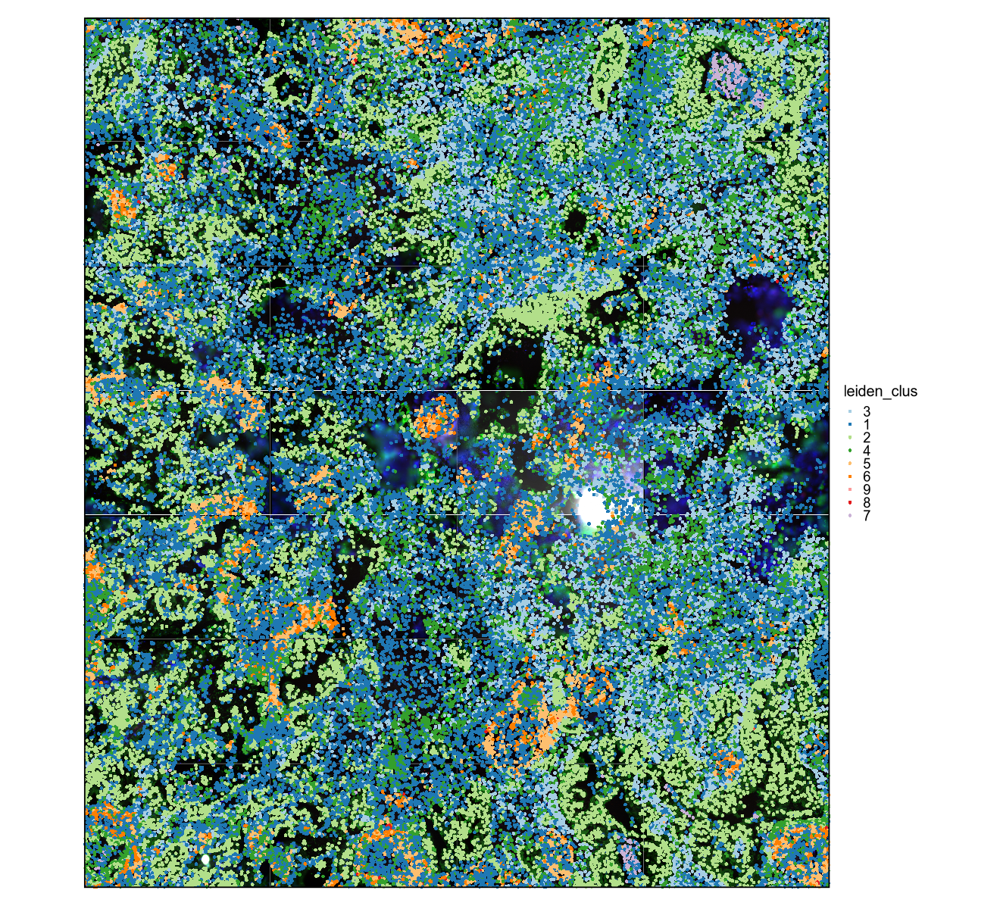

In [10]:
options(repr.plot.width = 11, repr.plot.height = 10)

cosmx@cell_metadata$cell$rna$leiden_clus <- as.character(cosmx@cell_metadata$cell$rna$leiden_clus)
SpatDimPlot(
    cosmx,
    image = TRUE,  # use all fovs
    group_by = "leiden_clus",
    points_size = 1
)

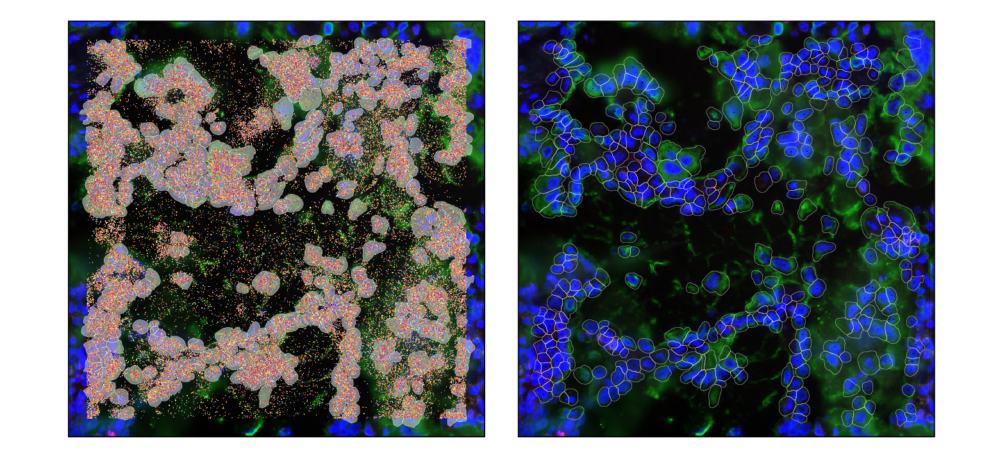

In [11]:
# Small Subset Visualization

options(repr.plot.width = 13, repr.plot.height = 6)

#subset a Giotto object based on spatial locations
smallfov <- subsetGiottoLocs(cosmx,
    x_max = 3000,
    x_min = 1000,
    y_max = -157800,
    y_min = -159800
)

#extract all genes observed in new object
smallfeats <- fDataDT(smallfov)[, feat_ID]

#plot all genes
ext <- c(900, 3100, -159900, -157700)
p1 <- SpatDimPlot(
    smallfov,
    image = "composite_fov002",
    ext = ext,
    shapes = TRUE,
    features = smallfeats,
    points_size = 0.1,
    shapes_border_size = 0.1,
    shapes_border_color = "white",
    legend.position = "none"
)
p2 <- SpatDimPlot(
    smallfov,
    image = "composite_fov002",
    ext = ext,
    shapes = TRUE,
    points_size = 0.1,
    shapes_border_size = 0.1,
    shapes_border_color = "white",
    shapes_alpha = 0
)
p1 + p2

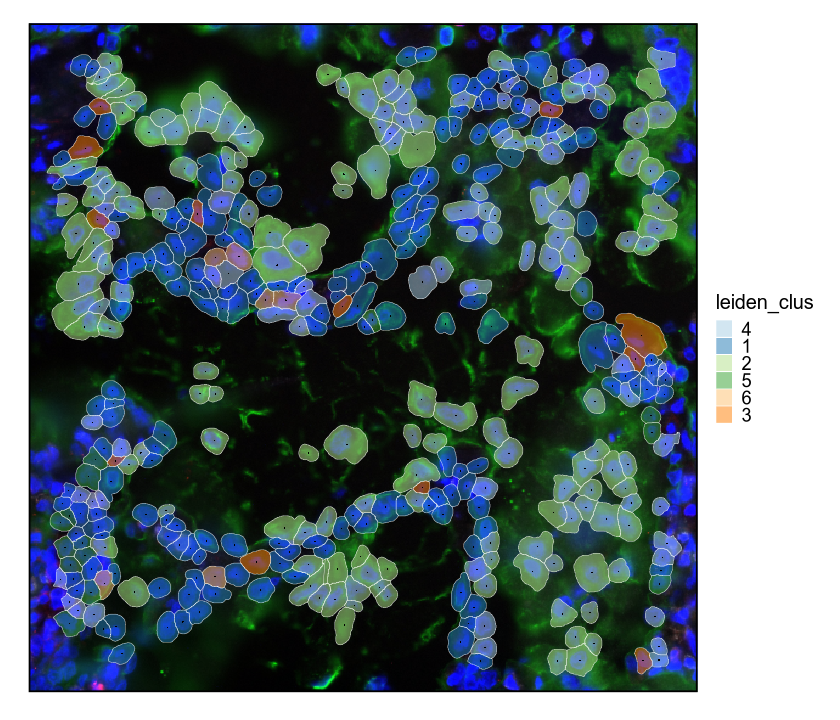

In [12]:

options(repr.plot.width = 7, repr.plot.height = 6)

SpatDimPlot(
    smallfov,
    image = "composite_fov002",
    ext = ext,
    shapes = TRUE,
    points_size = 0.1,
    shapes_fill_by = "leiden_clus",
    shapes_border_size = 0.1,
    shapes_border_color = "white"
)

In [13]:
# create spatial network based on physical distance of cell centroids
cosmx <- createSpatialNetwork(cosmx,
    minimum_k = 2,
    maximum_distance_delaunay = 50
)

# perform Binary Spatial Extraction of genes - NOTE: Depending on your system this could take time
km_spatialfeats <- binSpect(cosmx)

Setting spatial network [cell] Delaunay_network


This is the single parameter version of binSpect


1. matrix binarization complete


2. spatial enrichment test completed


3. (optional) average expression of high
 expressing cells calculated


4. (optional) number of high expressing cells
 calculated



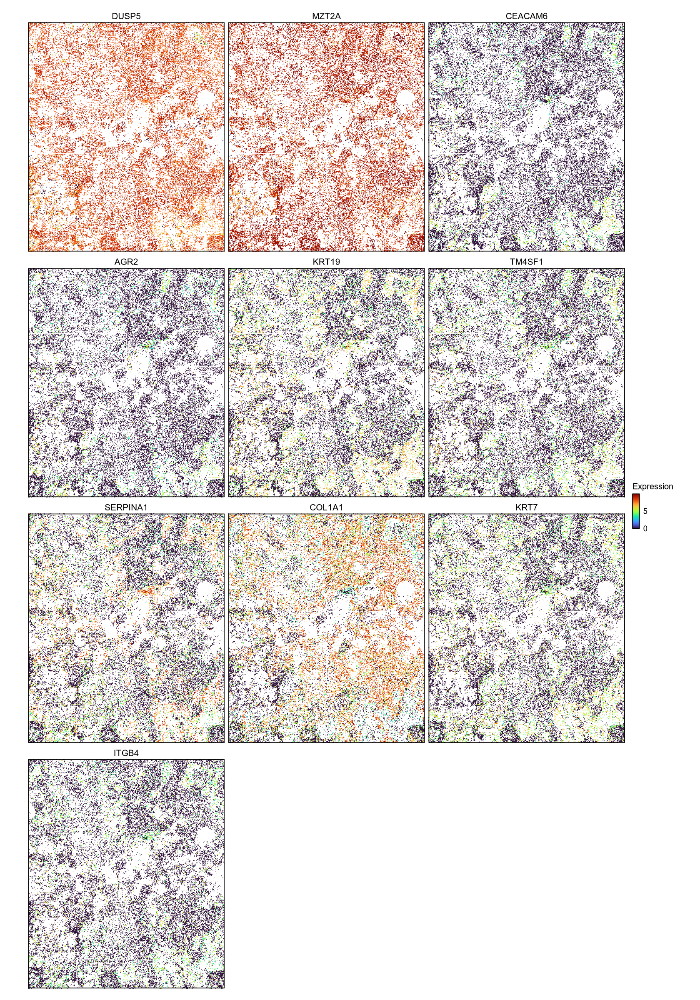

In [14]:

options(repr.plot.width = 14, repr.plot.height = 20)

SpatFeaturePlot(
    cosmx,
    features = km_spatialfeats$feats[1:10],
    points_border_size = 0.01,
    points_size = 0.01,
    facet_ncol = 3,
    padding = 0
)

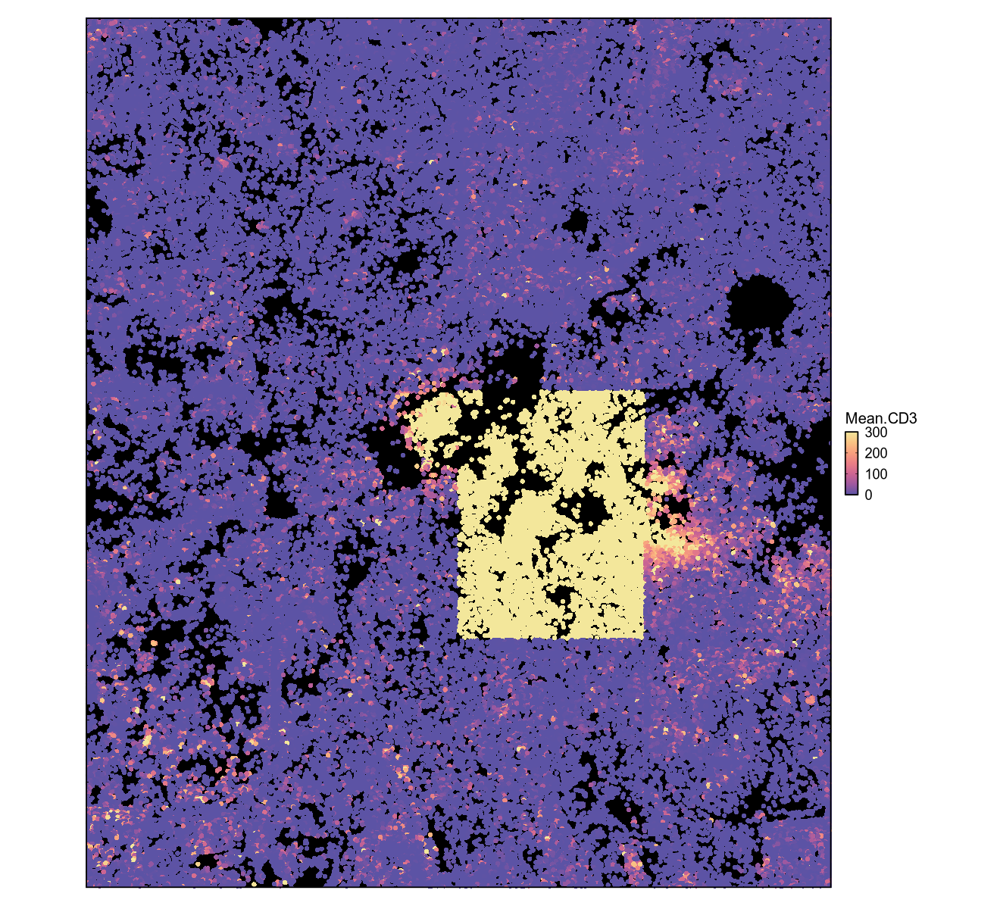

In [19]:
options(repr.plot.width = 11, repr.plot.height = 10)

SpatFeaturePlot(
    cosmx,
    image = "black",
    features = "Mean.CD3",
    upper_cutoff = 300,
    palette = "Sunset",
    palette_reverse = TRUE
)

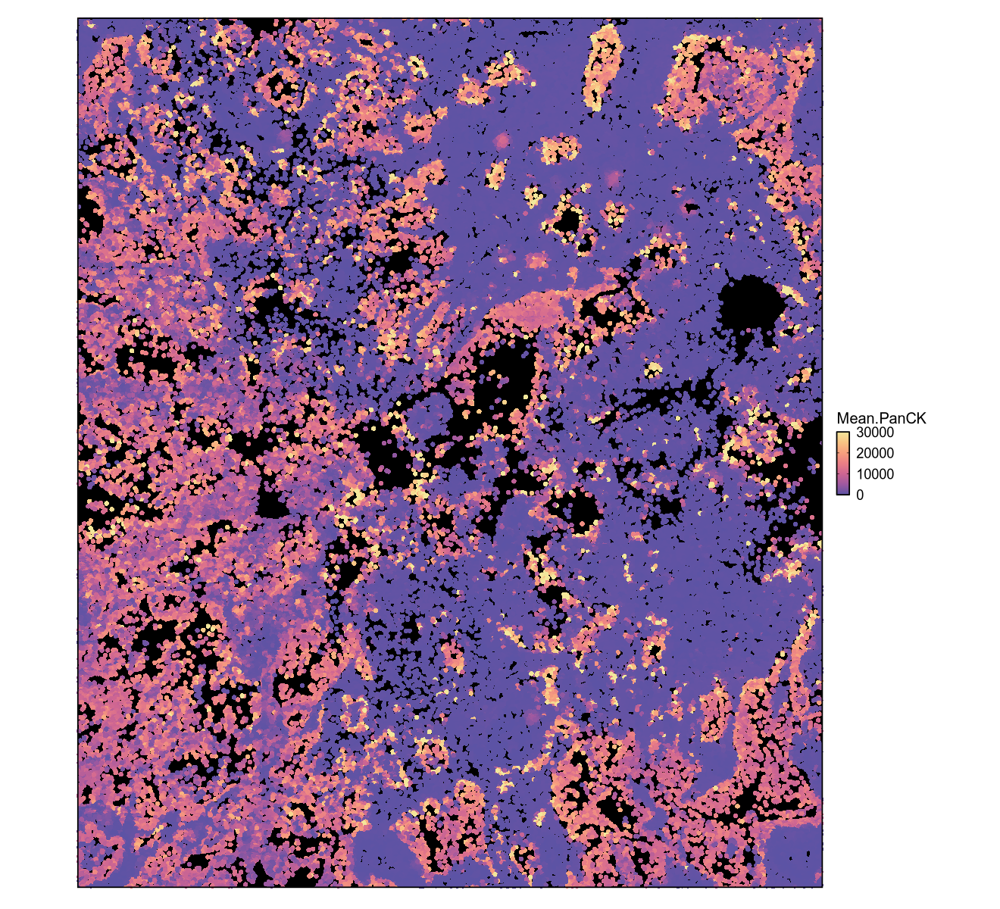

In [20]:
options(repr.plot.width = 11, repr.plot.height = 10)

SpatFeaturePlot(
    cosmx,
    image = "black",
    features = "Mean.PanCK",
    upper_cutoff = 3e4,
    palette = "Sunset",
    palette_reverse = TRUE
)

In [39]:
x <- sessionInfo()
x <- capture.output(print(x))
# hide the BLAS/LAPACK paths
x <- x[!startsWith(x, "BLAS/LAPACK:")]
cat(paste(x, collapse = "\n"))

R version 4.4.3 (2025-02-28)
Platform: x86_64-conda-linux-gnu
Running under: Red Hat Enterprise Linux 8.10 (Ootpa)

Matrix products: default

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=C              
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/Chicago
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] scplotter_0.4.0   Giotto_4.2.1      GiottoClass_0.4.7

loaded via a namespace (and not attached):
  [1] fs_1.6.6                    matrixStats_1.5.0          
  [3] spatstat.sparse_3.1-0       bitops_1.0-9               
  [5] devtools_2.4.5              httr_1.4.7                 
  [7] RColorBrewer_1.1-3 